# Model PDE (FitzHugh-Nagumo)

Biblioteki: `pip install numpy scipy matplotlib scikit-learn tensorflow`

## Zadanie 2
Zadanie 2 polega na uruchomieniu modelu dla różnych solwerów i porównanie wyników. Wnioski dotyczą 
- (1) czasów obliczeń dla różnych rozdzielczości czasowo-przestrzennych,
- (2) wyboru ekstremalnych parametrów modelu, a także warunków początkowych i brzegowych, 
- (3) ocenić w jakich przedziałach mogą zawierać się te parametry 
- (4) przygotowanie prezentacji. 

## Metody rozwiązywania

In [36]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import convolve2d
import time
import matplotlib.animation as animation
from IPython.display import HTML


class FHN_PDE_Simulator:
    """
    Symulator 2D modelu FitzHugh-Nagumo (PDE)
    Obsługuje dwa solwery: 'euler' (FTCS) i 'rk4' (Runge-Kutta 4).
    """
    def __init__(self, size=100, dt=0.01, dx=1.0, Du=1.0, Dv=0.5, 
                 a=0.1, b=0.5, epsilon=0.01, solver='euler', bc='wrap', noise_amp=0.01):
        
        self.size = size
        self.dt = dt
        self.dx = dx
        
        # Parametry modelu
        self.Du = Du
        self.Dv = Dv
        self.a = a
        self.b = b
        self.epsilon = epsilon
        
        # Wybór solwera
        if solver not in ['euler', 'rk4']:
            raise ValueError("Solver musi być 'euler' lub 'rk4'")
        self.solver_name = solver
        
        # BC dla convolve2d: 'wrap' (periodic) lub 'symm' (odbicie ~ Neumann)
        self.bc = bc
        
        # Dyskretny kernel Laplace'a
        self.laplacian_kernel = np.array([[0, 1, 0],
                                           [1, -4, 1],
                                           [0, 1, 0]]) / (self.dx**2)
        
        self.u = np.zeros((size, size))
        self.v = np.zeros((size, size))
        self.noise_amp = noise_amp
        
        self.set_initial_conditions()
        
        # prosty check stabilności (dla explicite FTCS)
        maxD = max(self.Du, max(self.Dv, 1e-12))
        stable_dt = (self.dx**2) / (4.0 * maxD)
        if self.solver_name == 'euler' and self.dt > stable_dt:
            print(f"UWAGA: dt={self.dt:.4e} może być niestabilne dla D={maxD:.3f} (est. dt<= {stable_dt:.4e}).")
            

    def set_initial_conditions(self, type='spiral'):
        """Ustawia warunki początkowe dla fal spiralnych."""
        self.u.fill(0)
        self.v.fill(0)
        
        N = self.size
        
        if type == 'block':
            self.u[N//4:N//2, N//4:N//2] = 1.0
            
        elif type == 'spiral_obstacle':
            # 1. Fala prosta z lewej strony
            self.u[:, :N//4] = 1.0
            
            # 2. Region inhibitora w kształcie litery C w środku
            # Zwiększamy wartość v w regionie przeszkody
            start_x, start_y = N//3, N//3
            width, height = N//3, N//3
            thickness = N//15  # Grubość "ścianek" C
            
            # Rysujemy kształt C - zewnętrzny prostokąt
            self.v[start_y:start_y+height, start_x:start_x+width] = 0.2  # Wysoki inhibitor
            
            # Wycinamy środek, tworząc C
            inner_start_x = start_x + thickness
            inner_start_y = start_y + thickness
            inner_width = width - 2 * thickness
            self.v[inner_start_y:start_y+height, 
                inner_start_x:inner_start_x+inner_width] = 0.0  # Brak inhibitora w środku
            
        elif type == 'spiral':
            # dolna połowa + mała przerwa
            self.u[N//2:, :] = 1.0
            gap = N // 12
            center = N//2
            self.u[center:center+gap, center-gap//2:center+gap//2] = 0.0
            self.v[N//2:, :] = 0.5

        elif type == 'spiral_v2':
            # L-shape z przerwą w rogu — typowy setup dla spiral
            half = N//2
            thickness = max(2, N//20)
            gap = max(2, N//18)
            # pionowy segment (lewa połowa)
            self.u[half: , :half] = 1.0
            # poziomy segment (dolna połowa)
            self.u[half:half+thickness, :] = 1.0
            # wytnij mały gap w rogu, żeby utworzyć wolny koniec
            self.u[half:half+gap, half-gap:half] = 0.0
            self.v[...] = 0.0
            self.v[half:half+gap, half-gap:half] = 1.0

        elif type == 'spiral_v3':
            """
            spiralna fala na poczatku w ksztalcie muszelki (spirala logarytmiczna?)
            """
            x = np.linspace(-1, 1, N)
            y = np.linspace(-1, 1, N)
            X, Y = np.meshgrid(x, y)
            theta = np.arctan2(Y, X)
            r = np.sqrt(X**2 + Y**2)
            spiral_condition = (r < 0.35 + 0.08 * theta) & (theta > -np.pi) & (r > 0.05)
            self.u[spiral_condition] = 1.0
            self.v[spiral_condition] = 0.0
        
        elif type == 'circle_inhib':
            """
            inhibitor w ksztalcie kółeczka
            """
            # 1. Fala prosta z lewej strony
            self.u[:, :N//4] = 1.0
            
            x = np.linspace(-1, 1, N)
            y = np.linspace(-1, 1, N)
            X, Y = np.meshgrid(x, y)
            theta = np.arctan2(Y, X)
            r = np.sqrt(X**2 + Y**2)
            spiral_condition = (r < 0.28)
            self.v[spiral_condition] = 0.15
            
        elif type == 'circle_inhibv2':
            """
            inhibitor w ksztalcie kółeczka
            """
            # 1. Fala prosta z lewej strony
            self.u[:, :N//4] = 1.0
            
            x = np.linspace(-1, 1, N)
            y = np.linspace(-1, 1, N)
            X, Y = np.meshgrid(x, y)
            theta = np.arctan2(Y, X)
            r = np.sqrt(X**2 + Y**2)
            spiral_condition = (r < 0.25)
            self.v[spiral_condition] = 0.15

        elif type == 'random':
            self.u = (np.random.rand(N, N) > 0.95).astype(float)
            

            
        # mały szum aby przełamać symetrię
        if self.noise_amp is not None and self.noise_amp > 0:
            self.u += self.noise_amp * np.random.randn(N, N)
            self.u = np.clip(self.u, 0.0, 1.0)

    def _laplacian(self, grid):
        """Oblicza $\nabla^2$ używając splotu (warunki brzegowe 'wrap')."""
        return convolve2d(grid, self.laplacian_kernel, mode='same', boundary='fill')

    def _reaction_term(self, u_grid, v_grid):
        """Oblicza człony reakcyjne f(u,v) i g(u,v)."""
        f_u = u_grid * (1 - u_grid) * (u_grid - self.a) - v_grid
        g_v = self.epsilon * (u_grid - self.b * v_grid)
        return f_u, g_v

    def _get_full_derivative(self, u_grid, v_grid):
        """Oblicza pełną pochodną czasową (dyfuzja + reakcja) dla RK4."""
        delta_u = self._laplacian(u_grid)
        delta_v = self._laplacian(v_grid)
        
        f_u, g_v = self._reaction_term(u_grid, v_grid)
        
        du_dt = self.Du * delta_u + f_u
        dv_dt = self.Dv * delta_v + g_v
        
        return du_dt, dv_dt

    def _step_euler(self):
        """Jeden krok solwera Eulera (FTCS)."""
        du_dt, dv_dt = self._get_full_derivative(self.u, self.v)
        self.u += self.dt * du_dt
        self.v += self.dt * dv_dt

    def _step_rk4(self):
        """Jeden krok solwera Runge-Kutta 4. rzędu."""
        # k1
        k1_u, k1_v = self._get_full_derivative(self.u, self.v)
        
        # k2
        u2 = self.u + 0.5 * self.dt * k1_u
        v2 = self.v + 0.5 * self.dt * k1_v
        k2_u, k2_v = self._get_full_derivative(u2, v2)

        # k3
        u3 = self.u + 0.5 * self.dt * k2_u
        v3 = self.v + 0.5 * self.dt * k2_v
        k3_u, k3_v = self._get_full_derivative(u3, v3)
        
        # k4
        u4 = self.u + self.dt * k3_u
        v4 = self.v + self.dt * k3_v
        k4_u, k4_v = self._get_full_derivative(u4, v4)
        
        # Złożenie
        self.u += (self.dt / 6.0) * (k1_u + 2*k2_u + 2*k3_u + k4_u)
        self.v += (self.dt / 6.0) * (k1_v + 2*k2_v + 2*k3_v + k4_v)

    def step(self):
        """Wykonuje jeden krok symulacji wybranym solwerem."""
        if self.solver_name == 'euler':
            self._step_euler()
        elif self.solver_name == 'rk4':
            self._step_rk4()

    def run_simulation(self, steps, snapshot_interval=10, return_both=False):
            """Uruchamia symulację i zwraca historię stanów.
            
            Parametry:
                steps: liczba kroków symulacji
                snapshot_interval: co ile kroków zapisywać stan
                return_both: jeśli True, zwraca krotkę (history_u, history_v)
            """
            print(f"Uruchamiam symulację PDE (Solver: {self.solver_name}, Rozdz: {self.size}x{self.size}, Kroki: {steps})...")
            start_time = time.time()
            
            history_u = []
            history_v = [] if return_both else None
            
            for step in range(steps):
                self.step()
                if step % snapshot_interval == 0:
                    history_u.append(np.copy(self.u))
                    if return_both:
                        history_v.append(np.copy(self.v))
                    
            end_time = time.time()
            self.last_run_time = end_time - start_time
            print(f"Symulacja PDE zakończona. Czas: {self.last_run_time:.4f} s")
            
            if return_both:
                return history_u, history_v
            else:
                return history_u


--- Zadanie 2, część 1: Czas vs Rozdzielczość ---
Uruchamiam symulację PDE (Solver: euler, Rozdz: 50x50, Kroki: 500)...
Symulacja PDE zakończona. Czas: 0.0729 s
Uruchamiam symulację PDE (Solver: euler, Rozdz: 100x100, Kroki: 500)...
Symulacja PDE zakończona. Czas: 0.2175 s
Uruchamiam symulację PDE (Solver: euler, Rozdz: 200x200, Kroki: 500)...
Symulacja PDE zakończona. Czas: 0.8676 s
Uruchamiam symulację PDE (Solver: euler, Rozdz: 350x350, Kroki: 500)...
Symulacja PDE zakończona. Czas: 2.8423 s


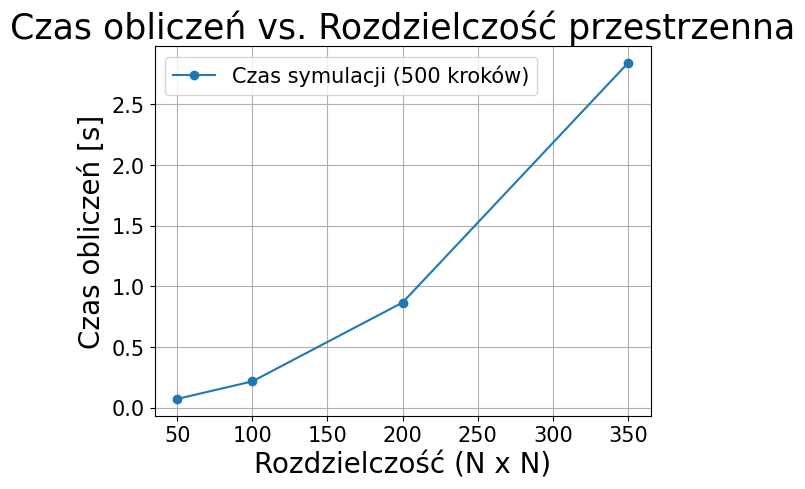

In [50]:
def task2_part1_timing(solver: str):
    print("--- Zadanie 2, część 1: Czas vs Rozdzielczość ---")
    resolutions = [50, 100, 200, 350] # Rozdzielczości przestrzenne
    timings = []
    
    for res in resolutions:
        # Zmniejsz dt wraz ze wzrostem rozdzielczości, aby zachować stabilność
        # Warunek stabilności (CFL) dla dyfuzji: dt <= dx^2 / (4 * D)
        dt = 0.5 * (1.0**2) / (4 * 1.0) # dx=1, Du=1
        
        sim = FHN_PDE_Simulator(size=res, dt=dt, dx=1.0, solver=solver)
        sim.run_simulation(steps=500)
        timings.append(sim.last_run_time)
        
    # Wykres czasu obliczeń
    ax = plt.subplot()
    plt.plot(resolutions, timings, 'o-', label='Czas symulacji (500 kroków)')
    plt.xlabel('Rozdzielczość (N x N)',fontsize=20)
    plt.ylabel('Czas obliczeń [s]',fontsize=20)
    plt.title('Czas obliczeń vs. Rozdzielczość przestrzenna',fontsize=25)
    plt.legend(fontsize=15)
    plt.grid(True)
    ax.tick_params(labelsize = 15)
    plt.show()

task2_part1_timing('euler')

--- Zadanie 2, część 1: Czas vs Rozdzielczość ---
Uruchamiam symulację PDE (Solver: rk4, Rozdz: 50x50, Kroki: 500)...
Symulacja PDE zakończona. Czas: 0.2765 s
Uruchamiam symulację PDE (Solver: rk4, Rozdz: 100x100, Kroki: 500)...
Symulacja PDE zakończona. Czas: 0.9886 s
Uruchamiam symulację PDE (Solver: rk4, Rozdz: 200x200, Kroki: 500)...
Symulacja PDE zakończona. Czas: 4.4246 s
Uruchamiam symulację PDE (Solver: rk4, Rozdz: 350x350, Kroki: 500)...
Symulacja PDE zakończona. Czas: 13.4753 s


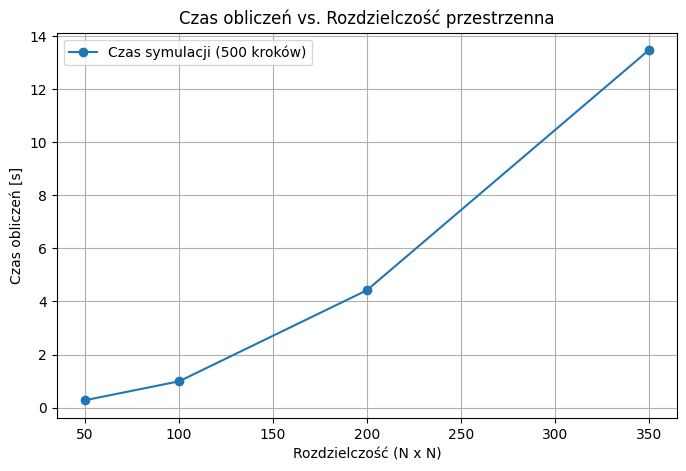

In [3]:
task2_part1_timing('rk4')

Uruchamiam symulację PDE (Solver: rk4, Rozdz: 100x100, Kroki: 1000)...
Symulacja PDE zakończona. Czas: 1.7805 s
Uruchamiam symulację PDE (Solver: rk4, Rozdz: 100x100, Kroki: 1000)...
Symulacja PDE zakończona. Czas: 1.8147 s


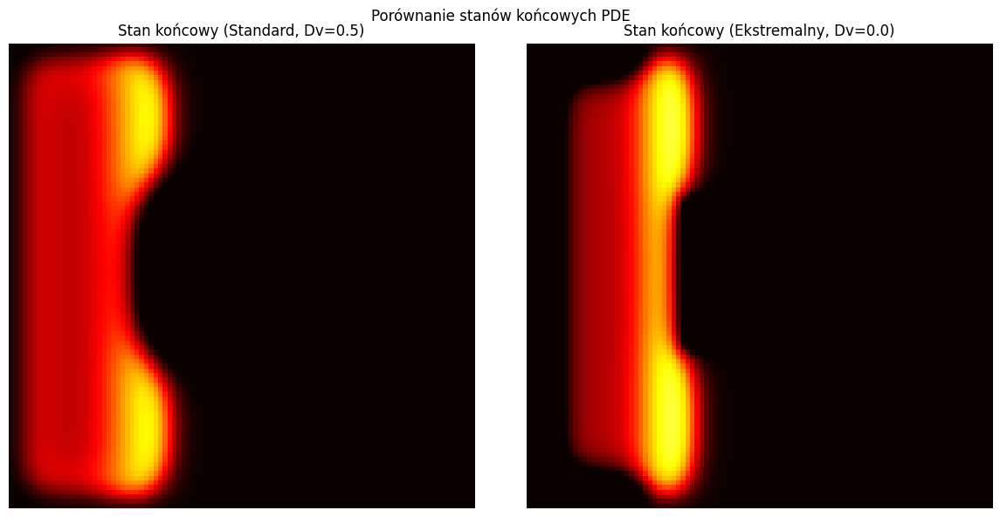

In [26]:
# Warunek 1: Standardowa spirala
sim1 = FHN_PDE_Simulator(size=100, dt=0.05, Du=1.0, Dv=0.5, a=0.1, epsilon=0.01, solver='rk4')
sim1.set_initial_conditions('spiral_obstacle')
# Potrzebujemy dłuższej symulacji dla ładnej spirali
history1 = sim1.run_simulation(steps=1000, snapshot_interval=500)

# Warunek 2: Ekstremalny (brak dyfuzji inhibitora)
sim2 = FHN_PDE_Simulator(size=100, dt=0.05, Du=1.0, Dv=0.0, a=0.1, epsilon=0.01, solver='rk4')
sim2.set_initial_conditions('spiral_obstacle')
history2 = sim2.run_simulation(steps=1000, snapshot_interval=500)

# --- Wykresy statyczne (jak poprzednio) ---
fig_static, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 6))
ax1.imshow(history1[-1], cmap='hot', vmin=0, vmax=1)
ax1.set_title('Stan końcowy (Standard, Dv=0.5)')
ax1.axis('off')

ax2.imshow(history2[-1], cmap='hot', vmin=0, vmax=1)
ax2.set_title('Stan końcowy (Ekstremalny, Dv=0.0)')
ax2.axis('off')

plt.suptitle('Porównanie stanów końcowych PDE')
plt.tight_layout()
plt.show()


In [51]:
sim2 = FHN_PDE_Simulator(size=200, dt=0.02, Du=1.0, Dv=0.0, a=0.05, b=0.3, epsilon=0.005, solver='euler', noise_amp=0.02)
sim2.set_initial_conditions('spiral_obstacle')

# Uruchamiamy symulację zwracając obie zmienne
history_u, history_v = sim2.run_simulation(steps=40000, snapshot_interval=500, return_both=True)

# TWORZENIE ANIMACJI Z OBIEMA ZMIENNYMI
fig_anim, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 5))

# Inicjalizacja wykresów
im1 = ax1.imshow(history_u[0], cmap='RdBu_r', animated=True, vmin=-0.5, vmax=1.2)
im2 = ax2.imshow(history_v[0], cmap='RdBu_r', animated=True, vmin=-0.5, vmax=0.5)

# Dodanie pasków kolorów
plt.colorbar(im1, ax=ax1)
plt.colorbar(im2, ax=ax2)

# Tytuły
ax1.set_title("Aktywator (u)")
ax2.set_title("Inhibitor (v)")
title = fig_anim.suptitle("Ewolucja fali spiralnej (t=0.00)")

def update_frame(frame_index):
    """Funkcja aktualizująca animację dla każdej klatki."""
    im1.set_array(history_u[frame_index])
    im2.set_array(history_v[frame_index])
    
    snapshot_interval = 20
    # Oblicz czas symulacji
    t = frame_index * sim2.dt * snapshot_interval 
    title.set_text(f"Ewolucja fali spiralnej (t={t:.2f})")
    
    return [im1, im2, title]

# Utwórz animację
ani = animation.FuncAnimation(
    fig_anim, 
    update_frame, 
    frames=len(history_u), 
    interval=30, 
    blit=True
)

plt.close(fig_anim)
display(HTML(ani.to_jshtml()))


Uruchamiam symulację PDE (Solver: euler, Rozdz: 200x200, Kroki: 40000)...
Symulacja PDE zakończona. Czas: 72.0475 s


In [56]:
ani.save('anim.gif',fps=10)

MovieWriter ffmpeg unavailable; using Pillow instead.


## Zadanie 3
- Stworzyć model surogatowy ODE zjawiska, ale tylko czasowy eliminując zmienną przestrzenną. 
- Dobrać ręcznie parametry. Porównać wyniki z oryginalnym modelem czasowo-przestrzennym. 
- Przy pomocy danych wygenerowanych w modelu w zadanym przedziale czasowym nauczyć sieć neuronową i porównać wyniki z modelem ODE i PDE. 
- Przygotować prezentację.

--- Zadanie 3, część 1: Porównanie PDE vs ODE ---
Generowanie danych treningowych z PDE...
Generowanie danych PDE zakończone.
Rozwiązywanie ODE...
Rozwiązywanie ODE zakończone.


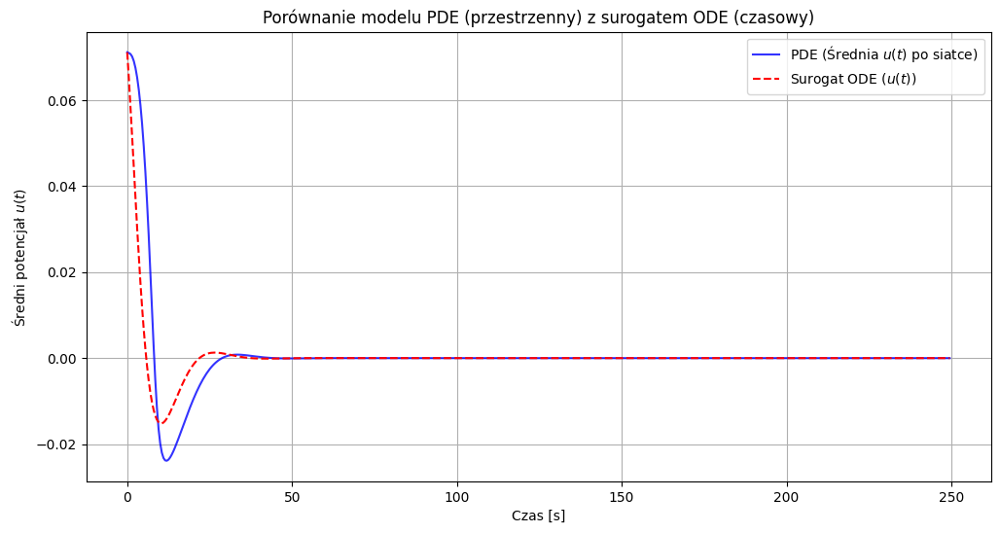

In [ ]:
from scipy.integrate import solve_ivp

def fhn_ode_surrogate(t, y, params):
    """
    Poprawiony 4-zmienny surogat ODE.
    y = [u, v, x, y]
    """
    u, v, x, y_rot = y
    a, b, epsilon, k1, k2, omega, gamma = params
    
    # Równania na podstawie skorygowanego PDF 
    du_dt = u * (1 - u) * (u - a) - v
    dv_dt = epsilon * (u - b * v)
    dx_dt = k1 * u - k2 * x          # Amplituda [cite: 15]
    dy_dt = omega * x - gamma * y_rot  # Rotacja [cite: 16]
    
    return [du_dt, dv_dt, dx_dt, dy_dt]

def task3_part1_ode_vs_pde():
    print("--- Zadanie 3, część 1: Porównanie PDE vs ODE ---")
    
    # --- 1. Generowanie danych z PDE ---
    # Używamy tych samych parametrów FHN co w ODE (a, b, epsilon)
    pde_params = {'a': 0.25, 'b': 1, 'epsilon': 0.05}
    sim_pde = FHN_PDE_Simulator(size=50, dt=0.05, **pde_params)
    sim_pde.set_initial_conditions('block')
    
    steps = 5000
    pde_history_u = []
    pde_time_vector = []
    
    print("Generowanie danych treningowych z PDE...")
    for i in range(steps):
        sim_pde.step()
        if i % 10 == 0:
            # Zapisujemy średni potencjał błonowy 
            pde_history_u.append(sim_pde.u.mean())
            pde_time_vector.append(i * sim_pde.dt)
            
    print("Generowanie danych PDE zakończone.")
    pde_time_vector = np.array(pde_time_vector)
    pde_history_u = np.array(pde_history_u)

    # --- 2. Ręczne strojenie i uruchomienie ODE ---
    # Musimy "ręcznie dobrać" parametry k1, k2, omega, gamma
    # aby oscylacje ODE pasowały do średniej z PDE.
    ode_params = [
        pde_params['a'], pde_params['b'], pde_params['epsilon'],
        1,  # k1 [cite: 17]
        0.5,  # k2 [cite: 17]
        0.1,  # omega (częstość obrotu) [cite: 18]
        0.1   # gamma (tłumienie) [cite: 19]
    ]
    
    # Warunki początkowe dla ODE
    y0_ode = [pde_history_u[0], 0, 0, 0] # [u, v, x, y_rot]
    t_span_ode = (pde_time_vector[0], pde_time_vector[-1])
    
    print("Rozwiązywanie ODE...")
    sol_ode = solve_ivp(
        fhn_ode_surrogate,
        t_span_ode,
        y0_ode,
        args=(ode_params,),
        t_eval=pde_time_vector, # Ewaluuj w tych samych punktach czasu co PDE
        method='RK45'
    )
    print("Rozwiązywanie ODE zakończone.")
    
    # --- 3. Wykres porównawczy PDE vs ODE ---
    plt.figure(figsize=(12, 6))
    plt.plot(pde_time_vector, pde_history_u, label='PDE (Średnia $u(t)$ po siatce)', color='blue', alpha=0.8)
    plt.plot(sol_ode.t, sol_ode.y[0], label='Surogat ODE ($u(t)$) ', color='red', linestyle='--')
    plt.xlabel('Czas [s]')
    plt.ylabel('Średni potencjał $u(t)$ ')
    plt.title('Porównanie modelu PDE (przestrzenny) z surogatem ODE (czasowy)')
    plt.legend()
    plt.grid(True)
    plt.show()
    
    # Zwracamy dane do następnego kroku
    return pde_time_vector, pde_history_u, sol_ode

# Zapisujemy wyniki do użycia w części 3
(dane_czas, dane_pde, wynik_ode) = task3_part1_ode_vs_pde()

array([[ 7.10850107e-02,  7.00316289e-02,  6.87810298e-02, ...,
        -1.94881742e-07, -1.89973278e-07, -1.84830153e-07],
       [ 0.00000000e+00,  3.52432051e-04,  6.98230900e-04, ...,
         9.92308319e-09,  8.93727271e-09,  7.97903213e-09],
       [ 0.00000000e+00,  6.45971094e-02,  6.88078007e-02, ...,
        -1.96751396e-07, -1.91946109e-07, -1.86895841e-07],
       [ 0.00000000e+00,  2.92384504e-03,  3.13393120e-03, ...,
         3.69462644e-07,  1.32382171e-06,  2.95388600e-07]],
      shape=(4, 500))

--- Zadanie 3, część 2: Surogat Sieci Neuronowej (NN) ---
Budowanie i trening modelu NN...
Epoch 1/20


d:\2studiowanie\sem2\ISZ\spiral_generation_FitzHugh-Nagumo\venv\Lib\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


13/13 ━━━━━━━━━━━━━━━━━━━━ 1s 15ms/step - loss: 0.0642 - val_loss: 0.0343
Epoch 2/20
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0200 - val_loss: 0.0045
Epoch 3/20
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0032 - val_loss: 4.6888e-04
Epoch 4/20
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0029 - val_loss: 2.3916e-05
Epoch 5/20
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0021 - val_loss: 2.8389e-04
Epoch 6/20
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0021 - val_loss: 1.1437e-04
Epoch 7/20
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0020 - val_loss: 2.4521e-05
Epoch 8/20
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0020 - val_loss: 7.5563e-05
Epoch 9/20
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0020 - val_loss: 4.3283e-05
Epoch 10/20
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0020 - val_loss: 1.0204e-04
Epoch 11/20
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0019 - val_loss: 2.3856e-05
Epoch 12/20
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/st

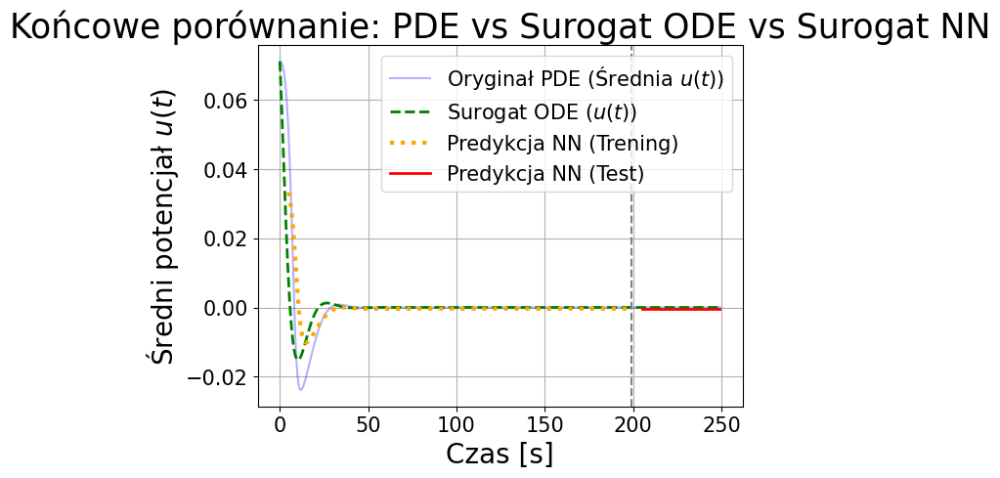

In [59]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error

def create_dataset(data, look_back=1):
    """Przekształca serię czasową w zbiór (X, y) do uczenia z nadzorem."""
    X, Y = [], []
    for i in range(len(data) - look_back - 1):
        a = data[i:(i + look_back)]
        X.append(a)
        Y.append(data[i + look_back])
    return np.array(X), np.array(Y)

def task3_part2_nn_surrogate(pde_time, pde_data, ode_solution):
    print("--- Zadanie 3, część 2: Surogat Sieci Neuronowej (NN) ---")

    # --- 1. Przygotowanie danych ---
    # Używamy danych $u(t)$ z symulacji PDE
    data = pde_data.reshape(-1, 1)
    
    # Skalowanie danych 0-1 (ważne dla NN)
    scaler = MinMaxScaler(feature_range=(0, 1))
    data_scaled = scaler.fit_transform(data)
    
    # Podział na zbiór treningowy i testowy
    train_size = int(len(data_scaled) * 0.8)
    train, test = data_scaled[0:train_size, :], data_scaled[train_size:len(data_scaled), :]
    
    look_back = 10 # Ile poprzednich kroków używamy do predykcji
    X_train, y_train = create_dataset(train, look_back)
    X_test, y_test = create_dataset(test, look_back)
    
    # Reshape dla LSTM [samples, time_steps, features]
    X_train = np.reshape(X_train, (X_train.shape[0], X_train.shape[1], 1))
    X_test = np.reshape(X_test, (X_test.shape[0], X_test.shape[1], 1))

    # --- 2. Budowa i trening modelu NN (LSTM) ---
    print("Budowanie i trening modelu NN...")
    model = Sequential()
    model.add(LSTM(16, input_shape=(look_back, 1)))
    model.add(Dense(1))
    model.compile(loss='mean_squared_error', optimizer='adam')
    
    model.fit(X_train, y_train, epochs=20, batch_size=32, verbose=1, validation_data=(X_test, y_test))
    print("Trening NN zakończony.")

    # --- 3. Predykcje ---
    print("Generowanie predykcji NN...")
    train_predict = model.predict(X_train)
    test_predict = model.predict(X_test)
    
    # Odwrócenie skalowania
    train_predict = scaler.inverse_transform(train_predict)
    y_train_orig = scaler.inverse_transform(y_train)
    test_predict = scaler.inverse_transform(test_predict)
    y_test_orig = scaler.inverse_transform(y_test)

    # --- 4. Końcowy wykres porównawczy: PDE vs ODE vs NN ---
    
    # Przygotowanie wektorów czasu dla wykresów NN
    time_train = pde_time[look_back:len(train_predict) + look_back]
    time_test = pde_time[len(train_predict) + (look_back * 2) + 1 : len(data) - 1]
    
    ax = plt.subplot()
    
    # Dane oryginalne (PDE)
    plt.plot(pde_time, pde_data, label='Oryginał PDE (Średnia $u(t)$)', color='blue', alpha=0.3)
    
    # Dane z surogatu ODE
    plt.plot(ode_solution.t, ode_solution.y[0], label='Surogat ODE ($u(t)$)', color='green', linestyle='--', linewidth=2)
    
    # Predykcje NN
    plt.plot(time_train, train_predict, label='Predykcja NN (Trening)', color='orange', linestyle=':',lw=3)
    plt.plot(time_test, test_predict, label='Predykcja NN (Test)', color='red', linestyle='-', linewidth=2)
    
    plt.xlabel('Czas [s]',fontsize = 20)
    plt.ylabel('Średni potencjał $u(t)$',fontsize = 20)
    plt.title('Końcowe porównanie: PDE vs Surogat ODE vs Surogat NN',fontsize = 25)
    ax.tick_params(labelsize=15)
    plt.legend(fontsize=15)
    plt.grid(True)
    plt.axvline(x=time_train[-1], color='gray', linestyle='--', label='Podział Trening/Test')
    plt.show()


task3_part2_nn_surrogate(dane_czas, dane_pde, wynik_ode)